In [ ]:
!nvidia-smi

Tue Jul 20 12:38:47 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 470.42.01    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   43C    P8    10W /  70W |      0MiB / 15109MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
# Mounting the drive and copying the code from github to drive...anilaknb@gmail.com
from google.colab import drive 
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
!unzip -q "/content/gdrive/My Drive/tiny-imagenet-200.zip"
!ls

gdrive	sample_data  tiny-imagenet-200


In [ ]:
!git clone https://github.com/anilbhatt1/Deep_Learning_EVA6_Phase1
%cd Deep_Learning_EVA6_Phase1/src
! ls

Cloning into 'Deep_Learning_EVA6_Phase1'...
remote: Enumerating objects: 633, done.
remote: Counting objects: 100% (63/63), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 633 (delta 32), reused 0 (delta 0), pack-reused 570
Receiving objects: 100% (633/633), 35.39 MiB | 31.48 MiB/s, done.
Resolving deltas: 100% (350/350), done.
/content/Deep_Learning_EVA6_Phase1/src
Alb_transforms.py  s7_model.py		       train_loss.py
main.py		   s8_resnet_cifar10_model.py  utilities.py
models.py	   s9_resnet_custom.py
README.md	   test_loss.py


In [ ]:
!pip install albumentations==1.0.0

     |████████████████████████████████| 98 kB 7.4 MB/s 
     |████████████████████████████████| 37.1 MB 47 kB/s 
  Attempting uninstall: albumentations
    Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import numpy as np
import cv2
import os
from PIL import Image
from tqdm import tqdm
from tqdm.notebook import trange, tqdm
import matplotlib.pyplot as plt
import albumentations as A
cuda = torch.cuda.is_available()
import datetime
from torch.utils.tensorboard import SummaryWriter
%load_ext tensorboard
print(f'Albumentations Version : {A.__version__}, Pytorch Version : {torch.__version__}, cuda:{cuda}')

Albumentations Version : 1.0.0, Pytorch Version : 1.9.0+cu102, cuda:True


In [ ]:
import main

200 Labels correspoding to tiny image-net 200 mapped with their corresponding n-ids



Data loading for train & test completed
Batch_size to be used : 256, CUDA Available? : True


/usr/local/lib/python3.7/dist-packages/albumentations/augmentations/transforms.py:645: FutureWarning: This class has been deprecated. Please use CoarseDropout
  FutureWarning,


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 64, 64]           1,728
       BatchNorm2d-2           [-1, 64, 64, 64]             128
            Conv2d-3           [-1, 64, 64, 64]          36,864
       BatchNorm2d-4           [-1, 64, 64, 64]             128
            Conv2d-5           [-1, 64, 64, 64]          36,864
       BatchNorm2d-6           [-1, 64, 64, 64]             128
   BasicBlock_Tiny-7           [-1, 64, 64, 64]               0
            Conv2d-8           [-1, 64, 64, 64]          36,864
       BatchNorm2d-9           [-1, 64, 64, 64]             128
           Conv2d-10           [-1, 64, 64, 64]          36,864
      BatchNorm2d-11           [-1, 64, 64, 64]             128
  BasicBlock_Tiny-12           [-1, 64, 64, 64]               0
           Conv2d-13          [-1, 128, 32, 32]          73,728
      BatchNorm2d-14          [-1, 128,

/usr/local/lib/python3.7/dist-packages/torch/optim/lr_scheduler.py:1290: UserWarning: To get the last learning rate computed by the scheduler, please use `get_last_lr()`.
  "please use `get_last_lr()`.", UserWarning)
  0%|          | 0/301 [00:00<?, ?it/s]

Initial LR :  [0.025]
Total steps :  9030
EPOCH: 0


Loss=4.3690 Batch=300 Train Acc=4.47: 100%|██████████| 301/301 [05:16<00:00,  1.05s/it]

Train set: Epoch : 1/30 Average loss: 4.3690, Train Accuracy: 4.47



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 1/30 Average loss: 4.3682, Test Accuracy: 8.49
EPOCH: 1


Loss=4.0243 Batch=300 Train Acc=12.54: 100%|██████████| 301/301 [05:34<00:00,  1.11s/it]

Train set: Epoch : 2/30 Average loss: 4.0243, Train Accuracy: 12.54



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 2/30 Average loss: 4.0077, Test Accuracy: 12.21
EPOCH: 2


Loss=3.4182 Batch=300 Train Acc=19.49: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 3/30 Average loss: 3.4182, Train Accuracy: 19.49



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 3/30 Average loss: 3.5017, Test Accuracy: 20.39
EPOCH: 3


Loss=3.0771 Batch=300 Train Acc=25.64: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 4/30 Average loss: 3.0771, Train Accuracy: 25.64



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 4/30 Average loss: 3.3398, Test Accuracy: 23.62
EPOCH: 4


Loss=2.8968 Batch=300 Train Acc=31.02: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 5/30 Average loss: 2.8968, Train Accuracy: 31.02



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 5/30 Average loss: 3.3994, Test Accuracy: 25.78
EPOCH: 5


Loss=2.5595 Batch=300 Train Acc=35.43: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 6/30 Average loss: 2.5595, Train Accuracy: 35.43



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 6/30 Average loss: 2.8957, Test Accuracy: 32.85
EPOCH: 6


Loss=2.5645 Batch=300 Train Acc=39.39: 100%|██████████| 301/301 [05:34<00:00,  1.11s/it]

Train set: Epoch : 7/30 Average loss: 2.5645, Train Accuracy: 39.39



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 7/30 Average loss: 2.7533, Test Accuracy: 35.71
EPOCH: 7


Loss=2.6755 Batch=300 Train Acc=43.01: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 8/30 Average loss: 2.6755, Train Accuracy: 43.01



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 8/30 Average loss: 2.6884, Test Accuracy: 37.18
EPOCH: 8


Loss=2.2425 Batch=300 Train Acc=46.18: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 9/30 Average loss: 2.2425, Train Accuracy: 46.18



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 9/30 Average loss: 2.6393, Test Accuracy: 38.14
EPOCH: 9


Loss=1.8749 Batch=300 Train Acc=49.30: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 10/30 Average loss: 1.8749, Train Accuracy: 49.3



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 10/30 Average loss: 2.4716, Test Accuracy: 41.87
EPOCH: 10


Loss=1.8828 Batch=300 Train Acc=51.85: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 11/30 Average loss: 1.8828, Train Accuracy: 51.85



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 11/30 Average loss: 2.5656, Test Accuracy: 41.08
EPOCH: 11


Loss=2.1171 Batch=300 Train Acc=54.73: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 12/30 Average loss: 2.1171, Train Accuracy: 54.73



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 12/30 Average loss: 2.5655, Test Accuracy: 41.77
EPOCH: 12


Loss=1.6440 Batch=300 Train Acc=57.03: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 13/30 Average loss: 1.6440, Train Accuracy: 57.03



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 13/30 Average loss: 2.7172, Test Accuracy: 39.82
EPOCH: 13


Loss=1.5196 Batch=300 Train Acc=59.00: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 14/30 Average loss: 1.5196, Train Accuracy: 59.0



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 14/30 Average loss: 2.4379, Test Accuracy: 44.36
EPOCH: 14


Loss=1.3643 Batch=300 Train Acc=61.58: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 15/30 Average loss: 1.3643, Train Accuracy: 61.58



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 15/30 Average loss: 2.6600, Test Accuracy: 41.18
EPOCH: 15


Loss=1.6822 Batch=300 Train Acc=63.72: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 16/30 Average loss: 1.6822, Train Accuracy: 63.72



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 16/30 Average loss: 2.5023, Test Accuracy: 43.43
EPOCH: 16


Loss=1.3591 Batch=300 Train Acc=66.39: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 17/30 Average loss: 1.3591, Train Accuracy: 66.39



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 17/30 Average loss: 2.6011, Test Accuracy: 44.21
EPOCH: 17


Loss=1.5098 Batch=300 Train Acc=68.77: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 18/30 Average loss: 1.5098, Train Accuracy: 68.77



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 18/30 Average loss: 2.6137, Test Accuracy: 43.26
EPOCH: 18


Loss=1.2209 Batch=300 Train Acc=71.18: 100%|██████████| 301/301 [05:31<00:00,  1.10s/it]

Train set: Epoch : 19/30 Average loss: 1.2209, Train Accuracy: 71.18



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 19/30 Average loss: 3.0779, Test Accuracy: 40.8
EPOCH: 19


Loss=1.2517 Batch=300 Train Acc=73.61: 100%|██████████| 301/301 [05:32<00:00,  1.10s/it]

Train set: Epoch : 20/30 Average loss: 1.2517, Train Accuracy: 73.61



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 20/30 Average loss: 2.7538, Test Accuracy: 44.25
EPOCH: 20


Loss=1.0448 Batch=300 Train Acc=75.63: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 21/30 Average loss: 1.0448, Train Accuracy: 75.63



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 21/30 Average loss: 2.8323, Test Accuracy: 44.35
EPOCH: 21


Loss=0.9560 Batch=300 Train Acc=77.84: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 22/30 Average loss: 0.9560, Train Accuracy: 77.84



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 22/30 Average loss: 3.0775, Test Accuracy: 43.75
EPOCH: 22


Loss=0.7380 Batch=300 Train Acc=80.43: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 23/30 Average loss: 0.7380, Train Accuracy: 80.43



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 23/30 Average loss: 2.8721, Test Accuracy: 44.84
EPOCH: 23


Loss=0.6628 Batch=300 Train Acc=82.77: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 24/30 Average loss: 0.6628, Train Accuracy: 82.77



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 24/30 Average loss: 2.8438, Test Accuracy: 45.51
EPOCH: 24


Loss=0.6561 Batch=300 Train Acc=85.29: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 25/30 Average loss: 0.6561, Train Accuracy: 85.29



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 25/30 Average loss: 2.7788, Test Accuracy: 47.48
EPOCH: 25


Loss=0.5570 Batch=300 Train Acc=87.80: 100%|██████████| 301/301 [05:33<00:00,  1.11s/it]

Train set: Epoch : 26/30 Average loss: 0.5570, Train Accuracy: 87.8



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 26/30 Average loss: 2.6740, Test Accuracy: 48.1
EPOCH: 26


Loss=0.3141 Batch=300 Train Acc=90.29: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 27/30 Average loss: 0.3141, Train Accuracy: 90.29



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 27/30 Average loss: 2.6628, Test Accuracy: 48.74
EPOCH: 27


Loss=0.2153 Batch=300 Train Acc=93.14: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 28/30 Average loss: 0.2153, Train Accuracy: 93.14



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 28/30 Average loss: 2.5982, Test Accuracy: 51.29
EPOCH: 28


Loss=0.1693 Batch=300 Train Acc=95.66: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 29/30 Average loss: 0.1693, Train Accuracy: 95.66



  0%|          | 0/301 [00:00<?, ?it/s]

Test set: Epoch : 29/30 Average loss: 2.5219, Test Accuracy: 51.75
EPOCH: 29


Loss=0.1085 Batch=300 Train Acc=97.45: 100%|██████████| 301/301 [05:32<00:00,  1.11s/it]

Train set: Epoch : 30/30 Average loss: 0.1085, Train Accuracy: 97.45


Test set: Epoch : 30/30 Average loss: 2.3953, Test Accuracy: 53.63
** Plotting misclassified test images from last epoch for Tiny Imagenet **




' s10_run_main() ended successfully '

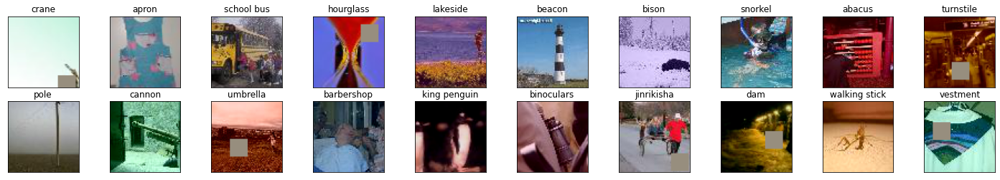

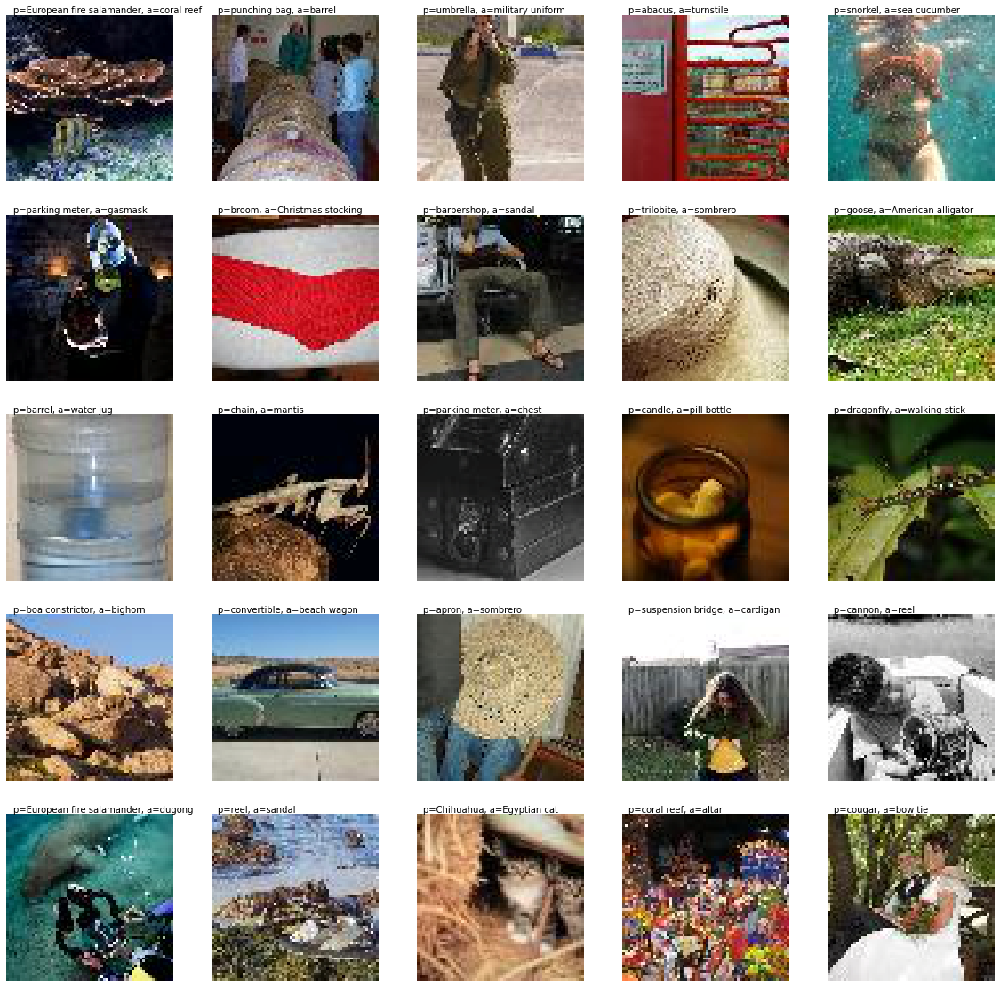

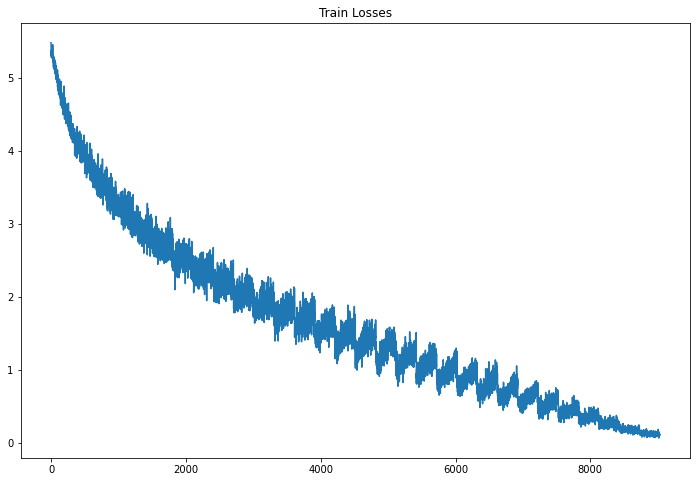

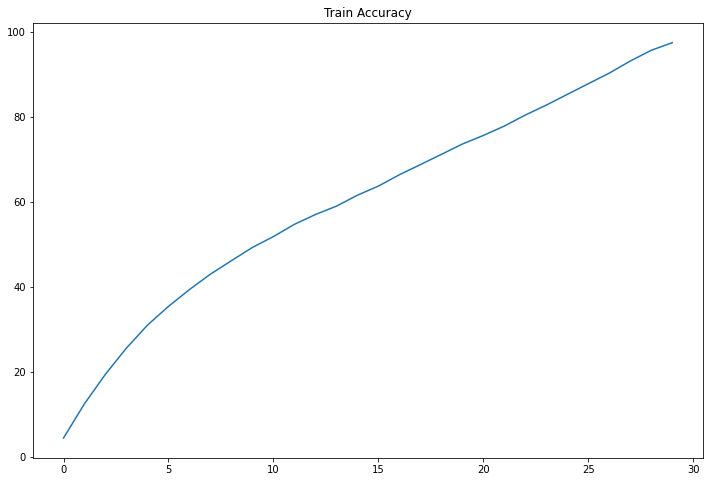

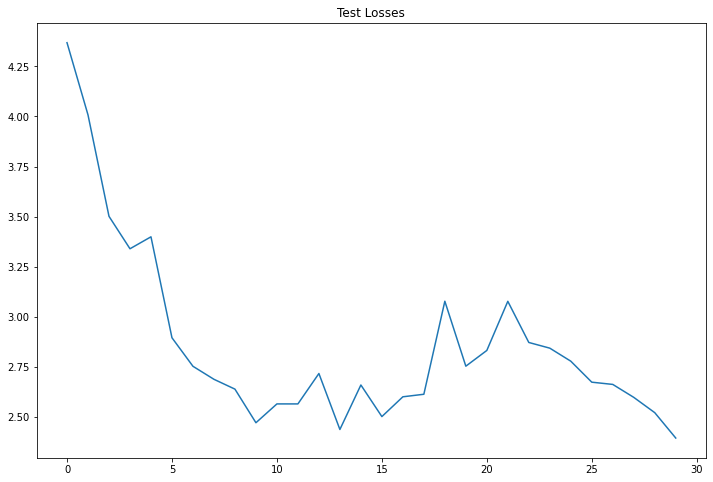

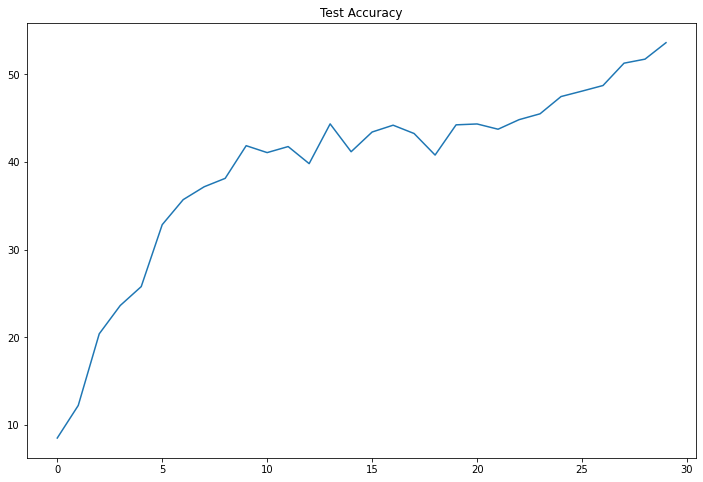

In [ ]:
num_epochs = 30
path = '/content/tiny-imagenet-200/'
img_save_path = '/content/gdrive/MyDrive/EVA6_P1_S10/'

main.s10_run_main(num_epochs, path, img_save_path)

In [ ]:
%tensorboard --logdir /content/gdrive/MyDrive/EVA6_P1_S10
#%tensorboard --logdir runs

<IPython.core.display.Javascript object>